In [1]:
%matplotlib notebook
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
from tqdm import tqdm
import contextily as cx
import xml.etree.ElementTree as ET
from shapely import wkt

In [2]:
# Load shapefiles
taz_data = gpd.read_file('taz2010.shp')

# Load CSV file
trip_data = pd.read_csv("od_simple.csv")

# load sumo tazs
tree = ET.parse('Taz_with_pseudo_link.add.xml')
root = tree.getroot()
sumo_taz = []
for taz in root.findall('taz'):
    tazid = taz.get('id')
    if tazid != 'taz_13':
        sumo_taz.append(int(tazid))


# 1- Overal view

In [3]:
test = taz_data.to_crs(epsg=3857)
test.loc[test['TAZ'].isin(sumo_taz),'COUNTY_NM']='Downtown'

<IPython.core.display.Javascript object>


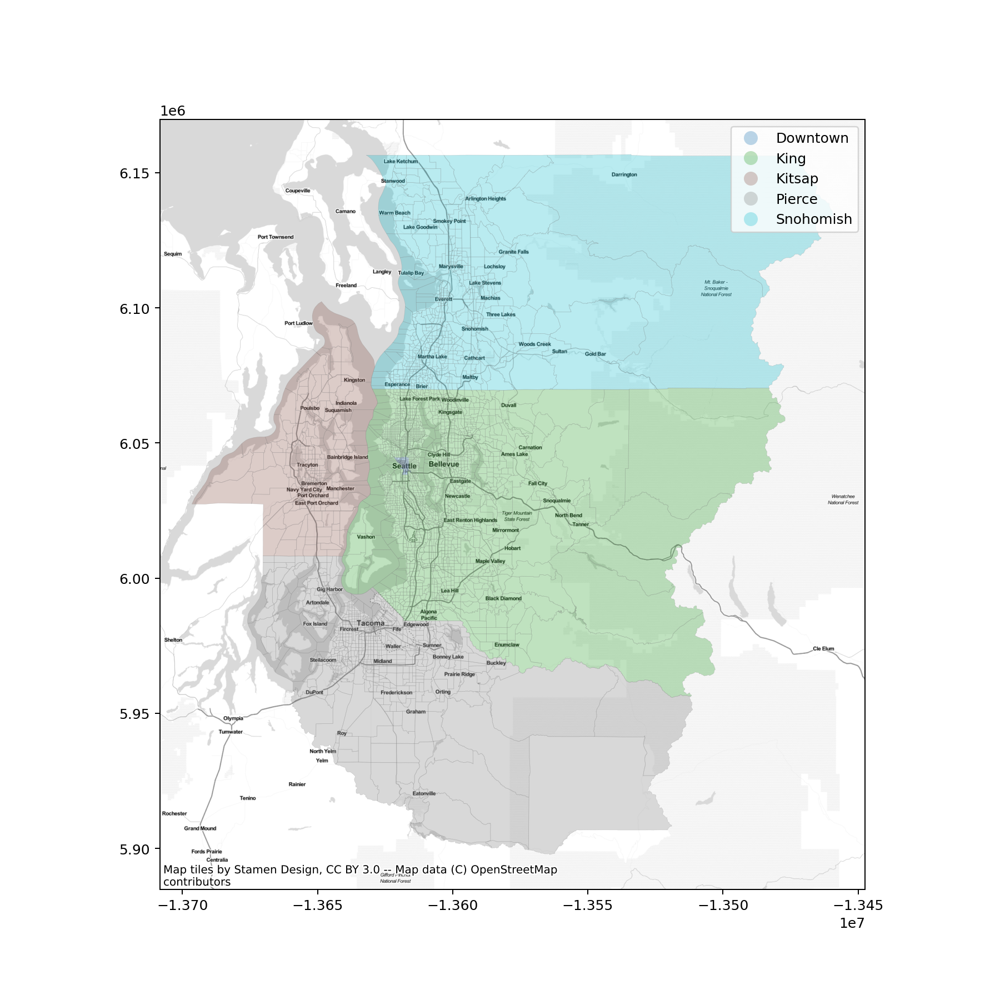

In [4]:
# ax = test.boundary.plot(figsize=(10, 10), alpha=0.25, edgecolor='g', linewidth=0.5)
ax = test.plot(column='COUNTY_NM',figsize=(10, 10), alpha=0.3, linewidth=0.25, edgecolor="grey", legend=True)
cx.add_basemap(ax, source=cx.providers.Stamen.TonerLite, zoom=10)

# 2- Yiran TAZ conversion
She only used trips where either origin or destination were in SUMO_TAZs. Then, she assigned out of SUMO_TAZs some pseudo TAZs (5000-level TAZs)

In [61]:
import pyproj
original_crs = pyproj.CRS(psrc_taz.crs)
new_crs = pyproj.CRS('EPSG:3857')
transformer = pyproj.Transformer.from_crs(original_crs, new_crs, always_xy=True)

In [59]:
#read taz data
psrc_taz = gpd.read_file('taz2010.shp') # don't wanna change taz_data 
#get centroid points from taz
lat_psrc = []
lon_psrc = []
for polys in psrc_taz['geometry'].values:
    p = wkt.loads(str(polys))
    latlon = p.centroid.wkt
    latlon = latlon[5:].split(' ')
    lon = float(latlon[1][1:])
    lat = float(latlon[2][:-1])
    lat_psrc.append(lat)
    lon_psrc.append(lon)

psrc_taz['lat'] = lat_psrc
psrc_taz['lon'] = lon_psrc

psrc_taz['lat'] = psrc_taz['lat']/10000
psrc_taz['lon'] = psrc_taz['lon']/10000
# psrc_taz['category'] = 'N/A'

In [68]:
lat_val = psrc_taz['lat'].values.T
lon_val = psrc_taz['lon'].values.T
tazs = psrc_taz['TAZ'].values.T

In [69]:
excluded_ferry_taz = [445, 449, 478, 610, 633]
manually_assigned_tazs= [444, 395, 396, 397, 398, 399, 400, 401, 402, 403, 405, 407, 408, 633, 655, 656, 657]

In [77]:
# mannual taz handling
category = []
for i in range(len(tazs)):
    if tazs[i] in excluded_ferry_taz:
            category.append('excluded')
    else:
        if tazs[i] in sumo_taz:
            category.append('sumo')
        elif tazs[i] in manually_assigned_tazs:
            category.append('manual')
        else:
            category.append('N/A')

psrc_taz['category'] = category

In [66]:
tx, ty = transformer.transform(1269239.11, 234216.69)
print(str(tx)+', '+str(ty))

tx, ty = transformer.transform(1269239.11, 232687.97)
print(str(tx)+', '+str(ty))

tx, ty = transformer.transform(1284922.78, 231025.87)
print(str(tx)+', '+str(ty))
tx, ty = transformer.transform(1284922.78, 220941.90000000002)
print(str(tx)+', '+str(ty))

tx, ty = transformer.transform(1276669.97, 219810.49)
print(str(tx)+', '+str(ty))
tx, ty = transformer.transform(1453569.5000000002, 142135.9)
print(str(tx)+', '+str(ty))

tx, ty = transformer.transform(1268039.96, 213677.05000000002)
print(str(tx)+', '+str(ty))
tx, ty = transformer.transform(1272297.9, 160689.81999999998)
print(str(tx)+', '+str(ty))

-13618698.330676828, 6045873.9793695705
-13618684.83028376, 6045181.833908857
-13611591.653777966, 6044565.323502221
-13611506.427675424, 6040001.331077583
-13615219.43563471, 6039418.677452042
-13535071.238035014, 6005497.72599157
-13619057.831330836, 6036568.429391239
-13616676.046544535, 6012673.203287524


<IPython.core.display.Javascript object>


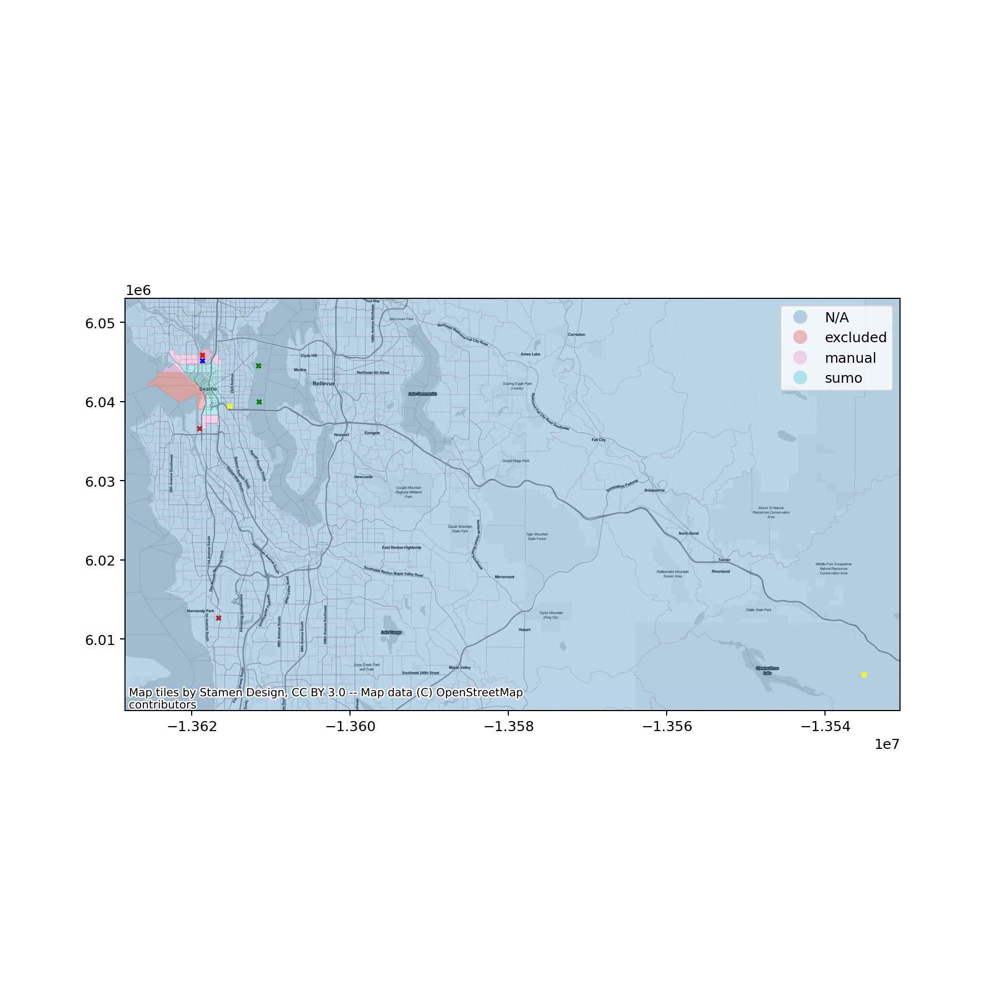

In [81]:
psrc_taz3857 = psrc_taz.to_crs(epsg=3857)
ax = psrc_taz3857[psrc_taz3857.COUNTY_NM == 'King'].plot(column='category',figsize=(10, 10), alpha=0.3, linewidth=0.25, edgecolor="grey", legend=True)
cx.add_basemap(ax, source=cx.providers.Stamen.TonerLite, zoom=12)

plt.scatter(-13618698.330676828, 6045873.9793695705, color='red', marker='x', s=10, label='SR-99N')
plt.scatter(-13618684.83028376, 6045181.833908857, color='blue', marker='x', s=10, label='I-5N')
plt.scatter(-13611591.653777966, 6044565.323502221, color='green', marker='x', s=10, label='East')
plt.scatter(-13611506.427675424, 6040001.331077583, color='green', marker='x', s=10, label='East')
plt.scatter(-13615219.43563471, 6039418.677452042, color='yellow', marker='x', s=10, label='I90')
plt.scatter(-13535071.238035014, 6005497.72599157, color='yellow', marker='x', s=10, label='I90')
plt.scatter(-13619057.831330836, 6036568.429391239, color='brown', marker='x', s=10, label='SR99S')
plt.scatter(-13616676.046544535, 6012673.203287524, color='brown', marker='x', s=10, label='SR99S')
# plt.legend()

# for lon, lat in zip(psrc_taz3857.lon, psrc_taz3857.lat):
#     x, y = transformer.transform(lon*10000, lat*10000)
#     plt.scatter(x, y, color='grey', marker='.', s=0.5)

In [13]:
#set up criteria to identify variables
#for lat, the larger, the higher; for lon, the larger, the more right
SR99N = [23.421669, 126.923911]
I5N = [23.268797,  126.923911]
East = [[23.102587, 128.492278],[22.09419, 128.492278]]
I90 = [[21.981049, 127.666997],[14.21359,145.35695]]
SR99S = [[21.367705, 126.803996],[16.068982,127.22979]]

In [83]:
category = []
for i in range(len(tazs)):
    # mannual taz conversion
    if tazs[i] in sumo_taz:
        category.append('sumo')
    else:
        if tazs[i] in excluded_ferry_taz:
            category.append('excluded')
        elif tazs[i] in manually_assigned_tazs:
            category.append('manual')
    # automatic taz coversion      
        #sr99N
        elif lat_val[i]>= SR99N[0] and lon_val[i]<=SR99N[1]:
            category.append('SR-99N')
        #I5N
        elif lat_val[i]>= I5N[0] and lon_val[i]>=I5N[1]:
            category.append('I-5N')
        #East
        elif lat_val[i]<=East[0][0] and lat_val[i]>=East[1][0] and lon_val[i]<=East[0][1]:
            category.append('East')
        elif lat_val[i]<=I90[0][0] and lat_val[i]>=I90[1][0] and lon_val[i]>=I90[0][1] and lon_val[i]<=I90[1][1]:
            category.append('I-90')
        elif lat_val[i]<=SR99S[0][0] and lat_val[i]>=SR99S[1][0] and lon_val[i]>=SR99S[0][1] and lon_val[i]<=SR99S[1][1]:
            category.append('SR-99S')
        else:
            category.append('I-5S')
psrc_taz['category'] = category

<IPython.core.display.Javascript object>


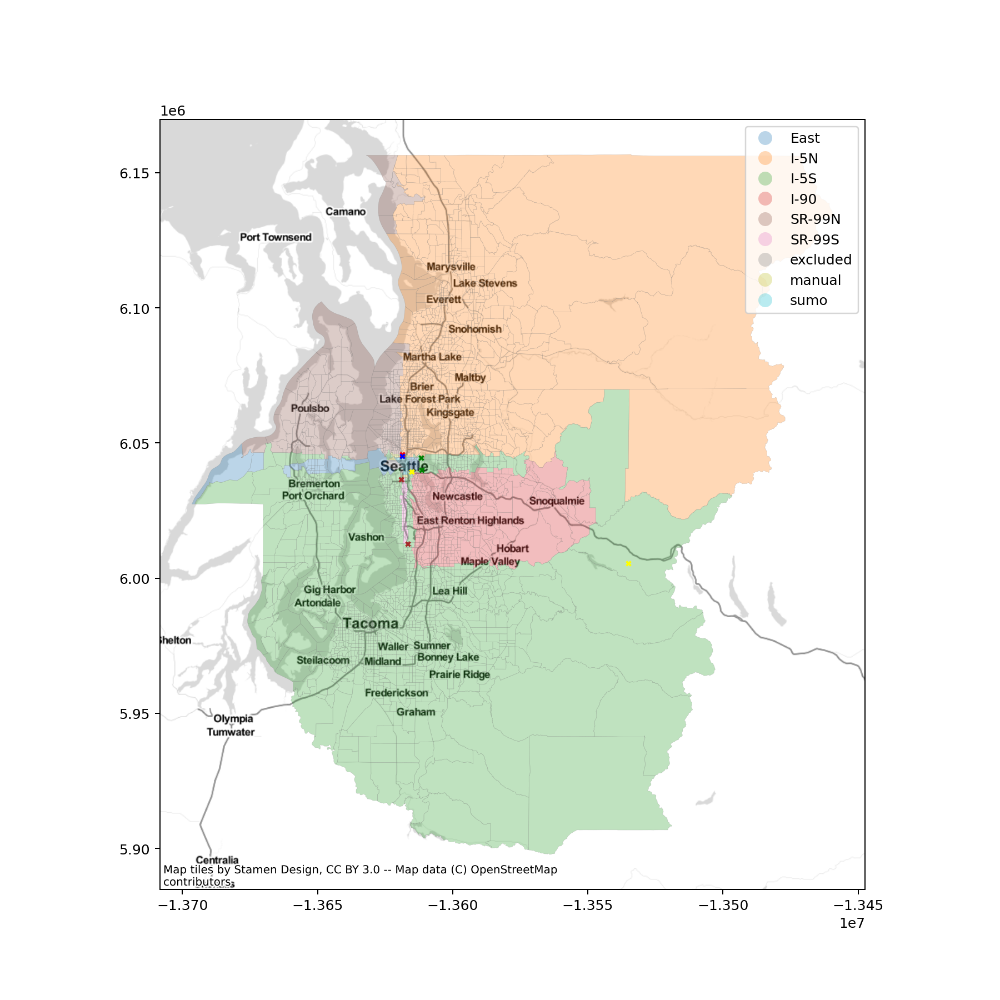

In [89]:
psrc_taz = psrc_taz.to_crs(epsg=3857)
# ax = psrc_taz[psrc_taz.COUNTY_NM == 'King'].plot(column='category',figsize=(10, 10), alpha=0.3, linewidth=0.25, edgecolor="grey", legend=True)
ax = psrc_taz.plot(column='category',figsize=(10, 10), alpha=0.3, linewidth=0.25, edgecolor="grey", legend=True)
cx.add_basemap(ax, source=cx.providers.Stamen.TonerLite, zoom=9)

plt.scatter(-13618698.330676828, 6045873.9793695705, color='red', marker='x', s=10, label='SR-99N')
plt.scatter(-13618684.83028376, 6045181.833908857, color='blue', marker='x', s=10, label='I-5N')
plt.scatter(-13611591.653777966, 6044565.323502221, color='green', marker='x', s=10, label='East')
plt.scatter(-13611506.427675424, 6040001.331077583, color='green', marker='x', s=10, label='East')
plt.scatter(-13615219.43563471, 6039418.677452042, color='yellow', marker='x', s=10, label='I90')
plt.scatter(-13535071.238035014, 6005497.72599157, color='yellow', marker='x', s=10, label='I90')
plt.scatter(-13619057.831330836, 6036568.429391239, color='brown', marker='x', s=10, label='SR99S')
plt.scatter(-13616676.046544535, 6012673.203287524, color='brown', marker='x', s=10, label='SR99S')
# plt.legend()

# for lon, lat in zip(psrc_taz3857.lon, psrc_taz3857.lat):
#     x, y = transformer.transform(lon*10000, lat*10000)
#     plt.scatter(x, y, color='grey', marker='.', s=0.25)

# 3- looking at details

In [3]:
merged_data = taz_data.merge(trip_data, left_on="TAZ", right_on="O")
merged_data = merged_data.merge(taz_data.loc[:, ['TAZ', 'COUNTY_NM']], left_on="D", right_on="TAZ")
merged_data.columns = ['TAZ', 'COUNTY_FIP', 'COUNTY_NM', 'geometry', 'O', 'D', 'demand', 'extra', 'dest_TAZ']
merged_data.drop(columns=['extra'], inplace=True)

max(taz_data.taz) is 3700 while in trip_data this number is 3951

In [4]:
invalids = trip_data[(trip_data['D']>3700) | (trip_data['O']>3700)]
print(f'out of {trip_data.demand.sum()} trips, {invalids.demand.sum()} had origin or destination higher than 3700')

out of 9985425 trips, 74662 had origin or destination higher than 3700


In [5]:
def show_flow(df, basemap=False, column=None, show_used_TAZs=False, title="Flow of Trips between Regions"):
    fig, ax = plt.subplots(figsize=(8, 8))
    taz_data_copy = taz_data.copy()
    
    if show_used_TAZs:
        print(len(taz_data_copy))
        Os = list(df['O'].values)
        Ds = list(df['D'].values)
        Os.extend(Ds)
        O_Ds = list(set(Os))
        taz_data_copy = taz_data_copy[taz_data_copy.TAZ.isin(O_Ds)]
        print(len(taz_data_copy))

    # Plot regions
    if basemap:
        taz_data_copy = taz_data_copy.to_crs(epsg=3857)
        if column is None:
            ax= taz_data_copy.plot(ax=ax, color='lightgrey', edgecolor='black', alpha=0.3, linewidth=0.25)
        else: 
            ax= taz_data_copy.plot(ax=ax, column=column, edgecolor='black', alpha=0.2, linewidth=0.25)
        cx.add_basemap(ax, source=cx.providers.Stamen.TonerLite, zoom=9)
    else:
        if column is None:
            ax= taz_data_copy.plot(ax=ax, color='lightgrey', edgecolor='black')
        else:
            ax= taz_data_copy.plot(ax=ax, column=column, edgecolor='black')

        
    # Plot flows as lines with width proportional to the number of trips
    unidentified_demand = 0
    total_demand = 0
    for index, row in tqdm(df.iterrows()):
        demand = row['demand']
        total_demand += demand
        if row['D']>3700:
            unidentified_demand+= demand
        else:
            start_point = taz_data_copy[taz_data_copy['TAZ'] == row['O']].geometry.iloc[0].centroid
            end_point = taz_data_copy[taz_data_copy['TAZ'] == row['D']].geometry.iloc[0].centroid
            plt.plot([start_point.x, end_point.x], [start_point.y, end_point.y], linewidth=row['demand']/2000, color='blue', alpha=0.5)

        
    print(f'total demand: {total_demand}')
    print(f'unidentified_demand:{unidentified_demand}')
    plt.title(title)
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.show()


### King county related

<IPython.core.display.Javascript object>


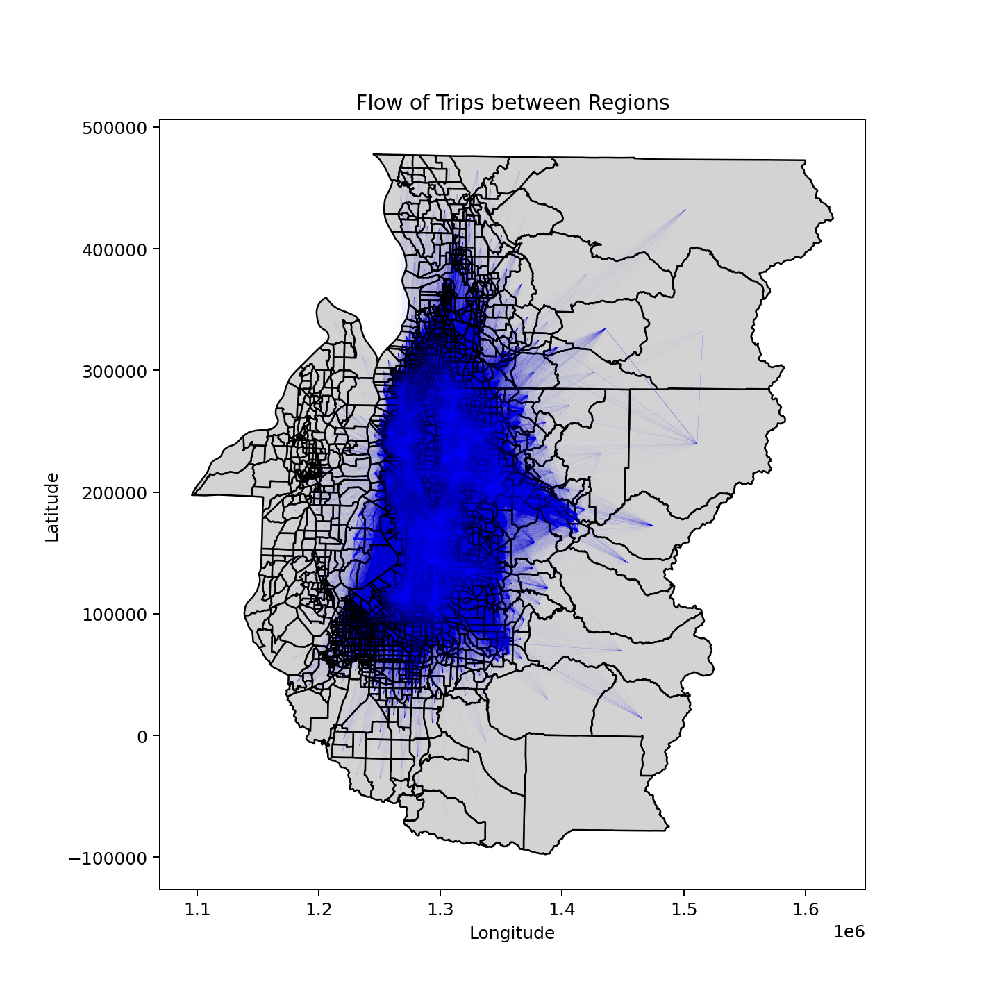

1470326it [43:49, 559.15it/s]

total demand: 5526826
unidentified_demand:21888


In [48]:
#flow for trips that were originated in king county
king_data = merged_data[merged_data['COUNTY_NM']=='King']
show_flow(king_data)

In [93]:
# trips with king county as their destination
king_tazs = taz_data[taz_data['COUNTY_NM']=='King'].TAZ.values
to_king_data = merged_data[merged_data['D'].isin(king_tazs)]
to_king_data.groupby(by='COUNTY_NM').demand.agg('sum')

COUNTY_NM
King         5040054
Kitsap          4439
Pierce        190369
Snohomish     269150
Name: demand, dtype: int64

In [95]:
to_king_data.demand.sum()

5504012

<IPython.core.display.Javascript object>


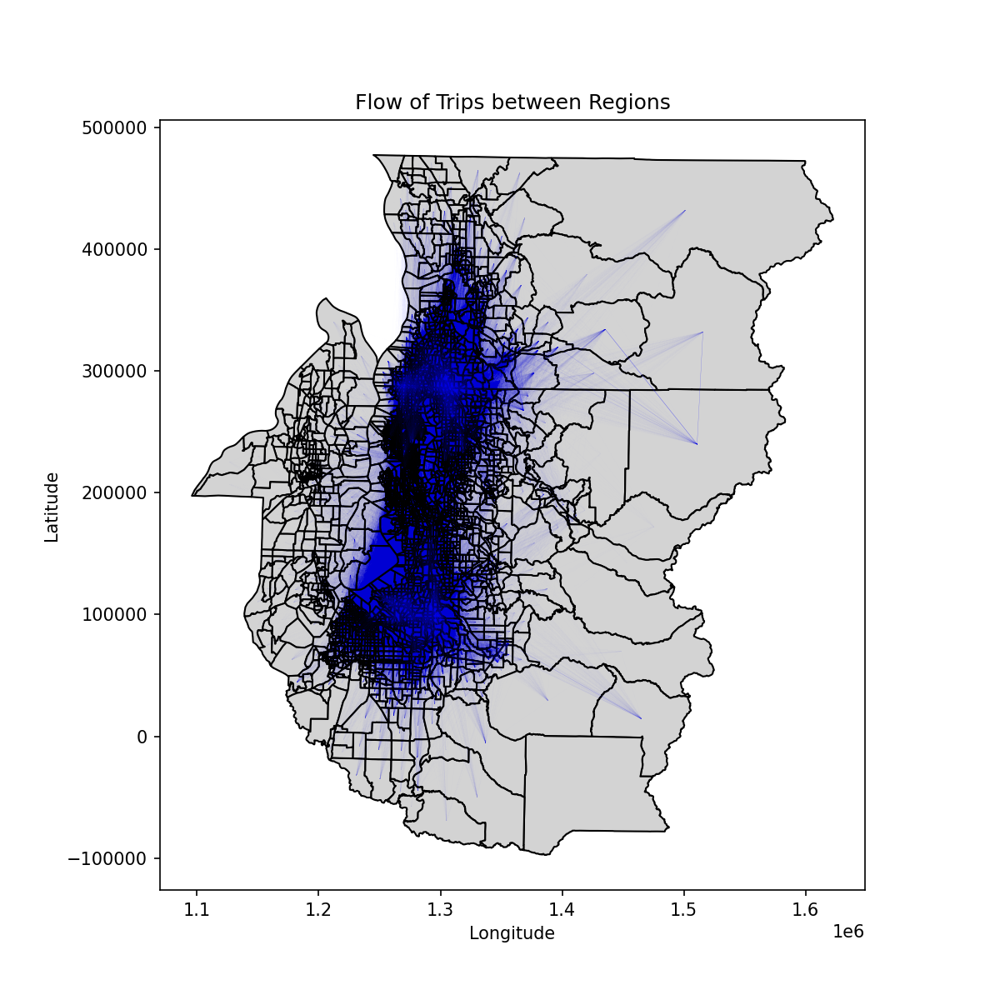

245138it [09:57, 410.52it/s]


total demand: 463958
unidentified_demand:0


In [15]:
show_flow(to_king_data[to_king_data['COUNTY_NM'] != 'King'])

### non-King

In [12]:
king_tazs = taz_data[taz_data['COUNTY_NM']=='King'].TAZ.values
non_king_data = merged_data[merged_data['COUNTY_NM']!='King']
non_king_data = non_king_data[~non_king_data['D'].isin(king_tazs)]

<IPython.core.display.Javascript object>


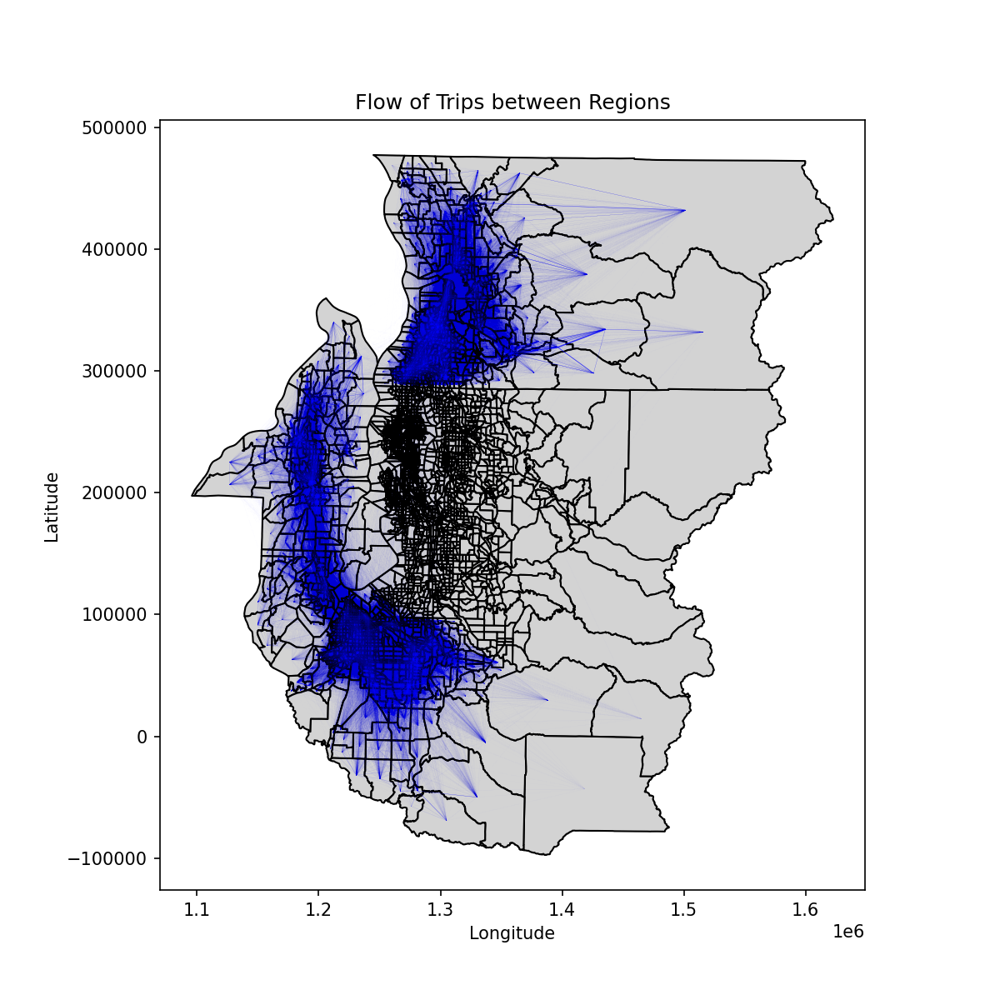

527820it [22:58, 382.93it/s]

total demand: 3957310
unidentified_demand:15443


In [18]:
show_flow(non_king_data)

based on the plot above, let's check trips between snohomish and pierce county

In [6]:
# trip distribution by numbers
merged_data.groupby(by=['COUNTY_NM', 'dest_TAZ'])['demand'].agg('sum')

COUNTY_NM  dest_TAZ 
King       King         5040054
           Kitsap          4615
           Pierce        190763
           Snohomish     269506
Kitsap     King            4439
           Kitsap        583266
           Pierce         26688
           Snohomish        487
Pierce     King          190369
           Kitsap         26752
           Pierce       1711413
           Snohomish       1040
Snohomish  King          269150
           Kitsap           496
           Pierce          1072
           Snohomish    1590653
Name: demand, dtype: int64

In [7]:
# trip distribution by percentages
merged_data.groupby(by=['COUNTY_NM', 'dest_TAZ'])['demand'].agg('sum')/merged_data.demand.sum() *100

COUNTY_NM  dest_TAZ 
King       King         50.854349
           Kitsap        0.046566
           Pierce        1.924806
           Snohomish     2.719326
Kitsap     King          0.044790
           Kitsap        5.885178
           Pierce        0.269283
           Snohomish     0.004914
Pierce     King          1.920831
           Kitsap        0.269929
           Pierce       17.268226
           Snohomish     0.010494
Snohomish  King          2.715734
           Kitsap        0.005005
           Pierce        0.010817
           Snohomish    16.049753
Name: demand, dtype: float64

1- kitsap-kitsap/pierce trips are not relevant to king county, and percent of trips between king/snohomish and kitsap is 0.046566+ 0.044790+0.004914+0.005005 = 0.01 % 
- therefore we fully eliminate trips to/from kitsap 

2- snohomish-pierce and pierce-snohomish that pass trough king county are negligible (0.010817+0.010494 = 0.02%)
- we eliminate trips between Snohomish and Pierce county

3- trips within pierce and snohomish are not relevant to king county
- we eliminate trips within Snohomish and Pierce county

### therefore, we only keep trips 1- within king county, 2- between king and pierce, and 3- between king and Snohomish



In [8]:
filtered_data = merged_data[(merged_data.COUNTY_NM != 'Kitsap') & (merged_data.dest_TAZ != 'Kitsap')]
filtered_data = filtered_data[~(
    (filtered_data.COUNTY_NM.isin(['Pierce', 'Snohomish'])) &
    (filtered_data.dest_TAZ.isin(['Pierce', 'Snohomish'])) )]

In [9]:
filtered_data.groupby(by=['COUNTY_NM', 'dest_TAZ'])['demand'].agg('sum')

COUNTY_NM  dest_TAZ 
King       King         5040054
           Pierce        190763
           Snohomish     269506
Pierce     King          190369
Snohomish  King          269150
Name: demand, dtype: int64

In [10]:
filtered_data.groupby(by=['COUNTY_NM', 'dest_TAZ'])['demand'].agg('sum')/filtered_data.demand.sum() *100

COUNTY_NM  dest_TAZ 
King       King         84.566906
           Pierce        3.200806
           Snohomish     4.522033
Pierce     King          3.194195
Snohomish  King          4.516059
Name: demand, dtype: float64

In [11]:
invalids = filtered_data[(filtered_data['D']>3700) | (filtered_data['O']>3700)]
print(f'out of {filtered_data.demand.sum()} trips, {invalids.demand.sum()} had origin or destination higher than 3700')

out of 5959842 trips, 0 had origin or destination higher than 3700


In [12]:
len(filtered_data)

1698946

<IPython.core.display.Javascript object>


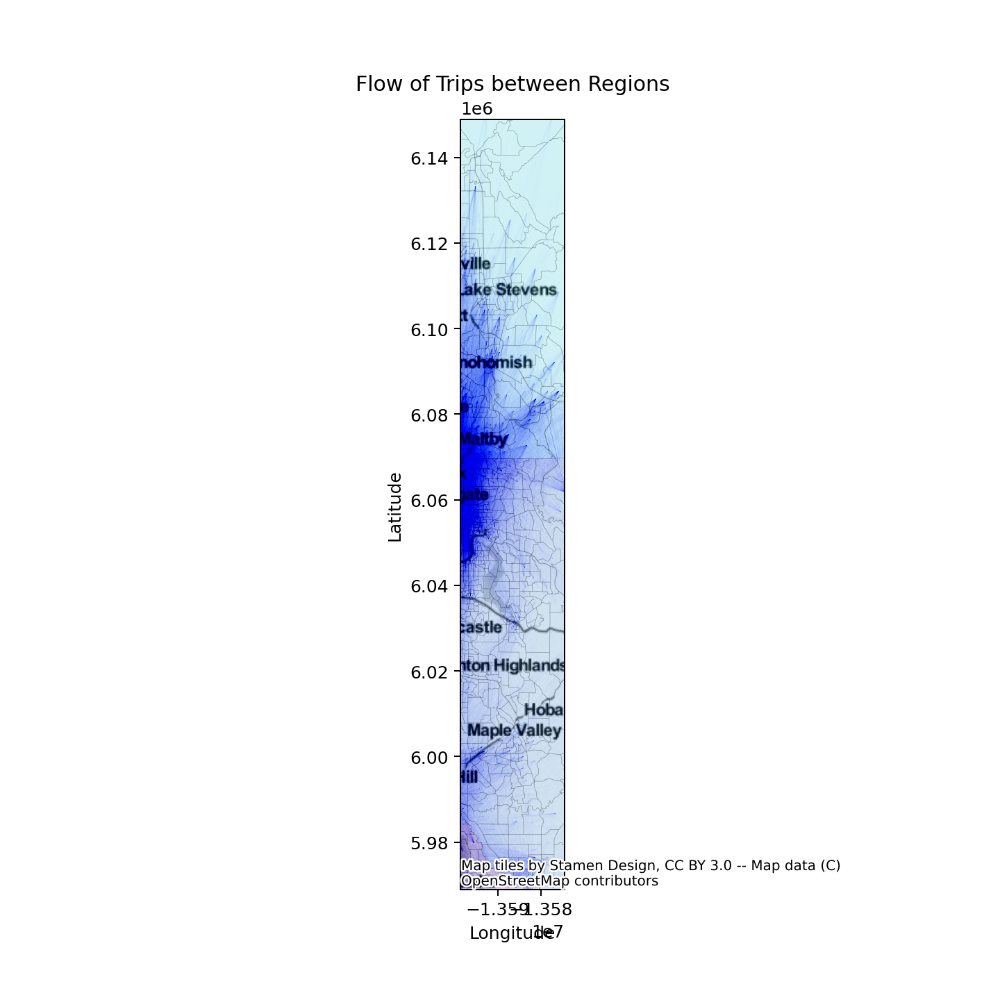

3700
3451


241376it [05:14, 768.36it/s]

total demand: 459519
unidentified_demand:0


In [10]:
show_flow(filtered_data[filtered_data['COUNTY_NM']!='King'], basemap=True, column='COUNTY_NM', show_used_TAZs=True)

<IPython.core.display.Javascript object>


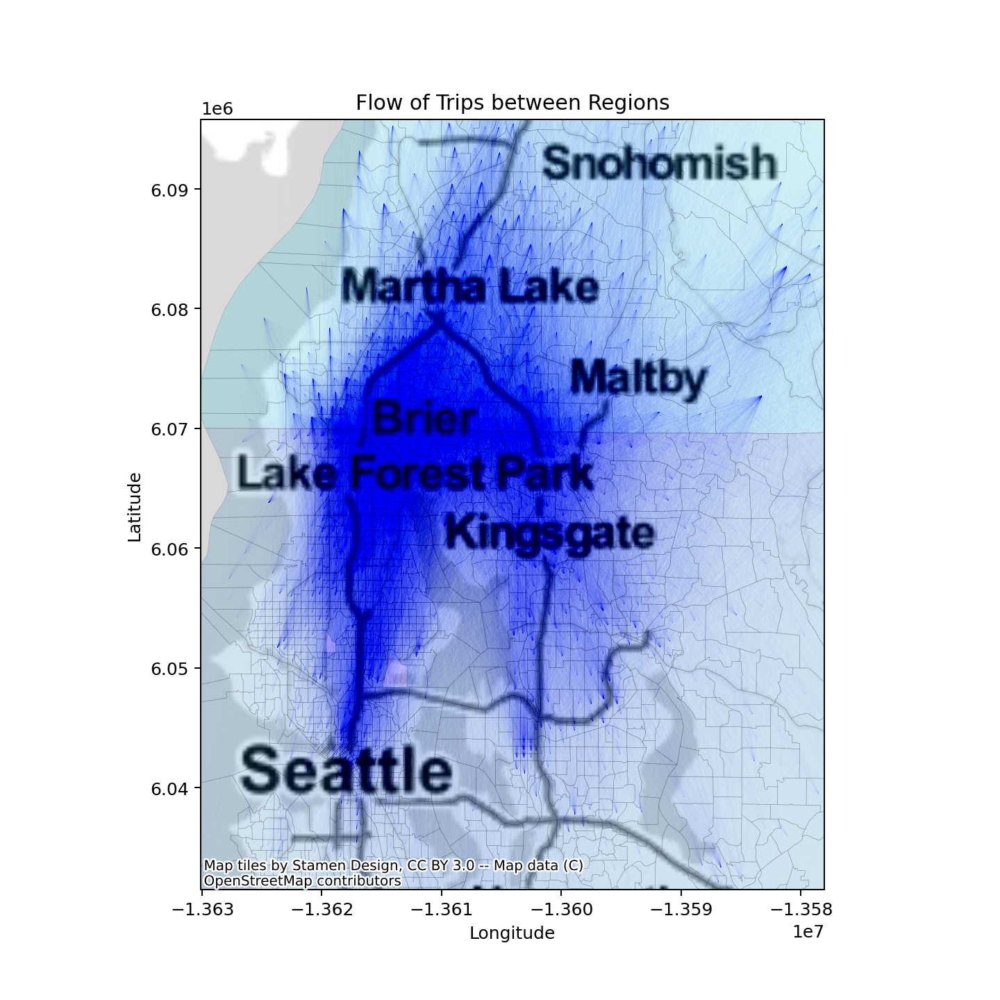

3700
2622


139844it [03:53, 598.76it/s]


total demand: 269150
unidentified_demand:0


In [11]:
show_flow(filtered_data[filtered_data['COUNTY_NM']=='Snohomish'], basemap=True, column='COUNTY_NM', show_used_TAZs=True)

<IPython.core.display.Javascript object>


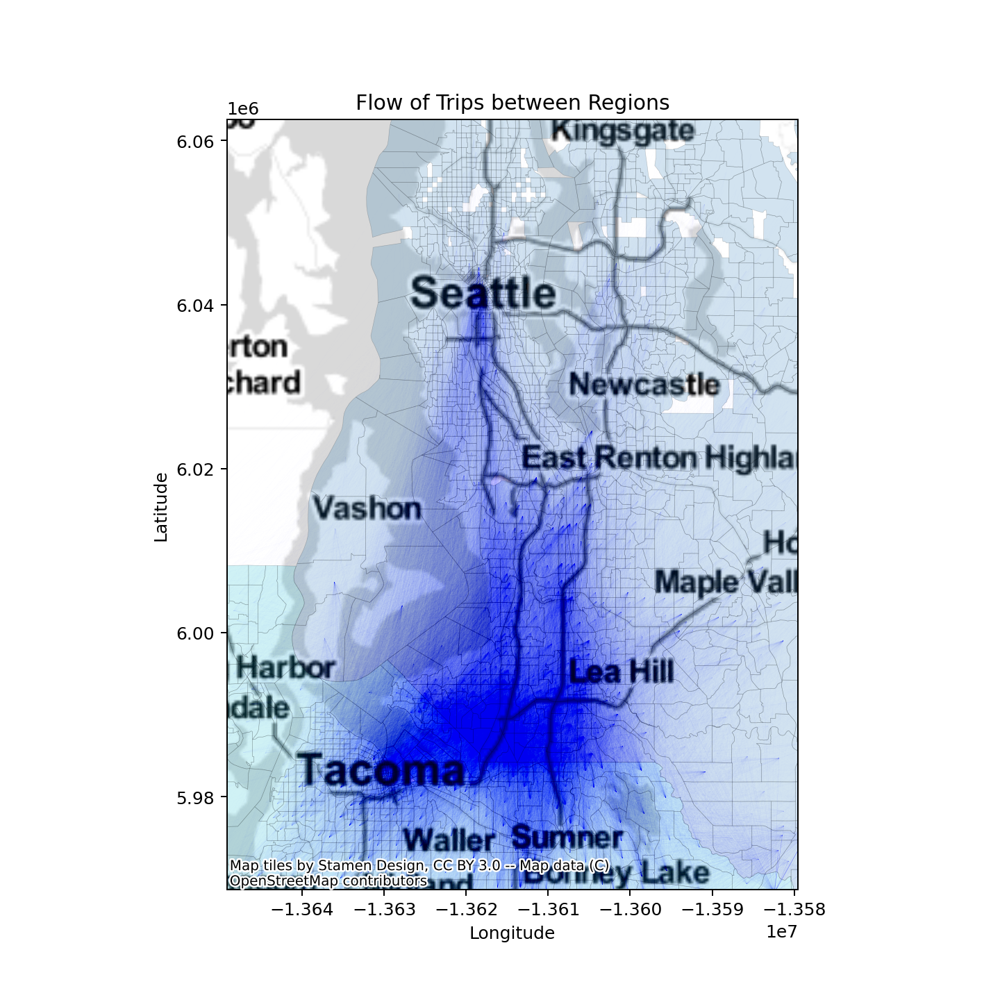

3700
2789


101532it [05:26, 310.88it/s]

total demand: 190369
unidentified_demand:0


In [12]:
show_flow(filtered_data[filtered_data['COUNTY_NM']=='Pierce'], basemap=True, column='COUNTY_NM', show_used_TAZs=True)

## For Pierce and Snohomish, 
it seems that majority of trips take place either between pierce and south of downtown OR snohomish and north of downtown, so what we do is keeping only the trips between snohomish/pierce and sumo TAZs

In [50]:
filtered_data = filtered_data[(filtered_data.COUNTY_NM=='King')|
                              (filtered_data.COUNTY_NM.isin(['Snohomish', 'Pierce']) & (filtered_data.D.isin(sumo_taz)))]


In [52]:
x= filtered_data[filtered_data.COUNTY_NM.isin(['Snohomish', 'Pierce'])]
x.demand.sum()

25656

<IPython.core.display.Javascript object>


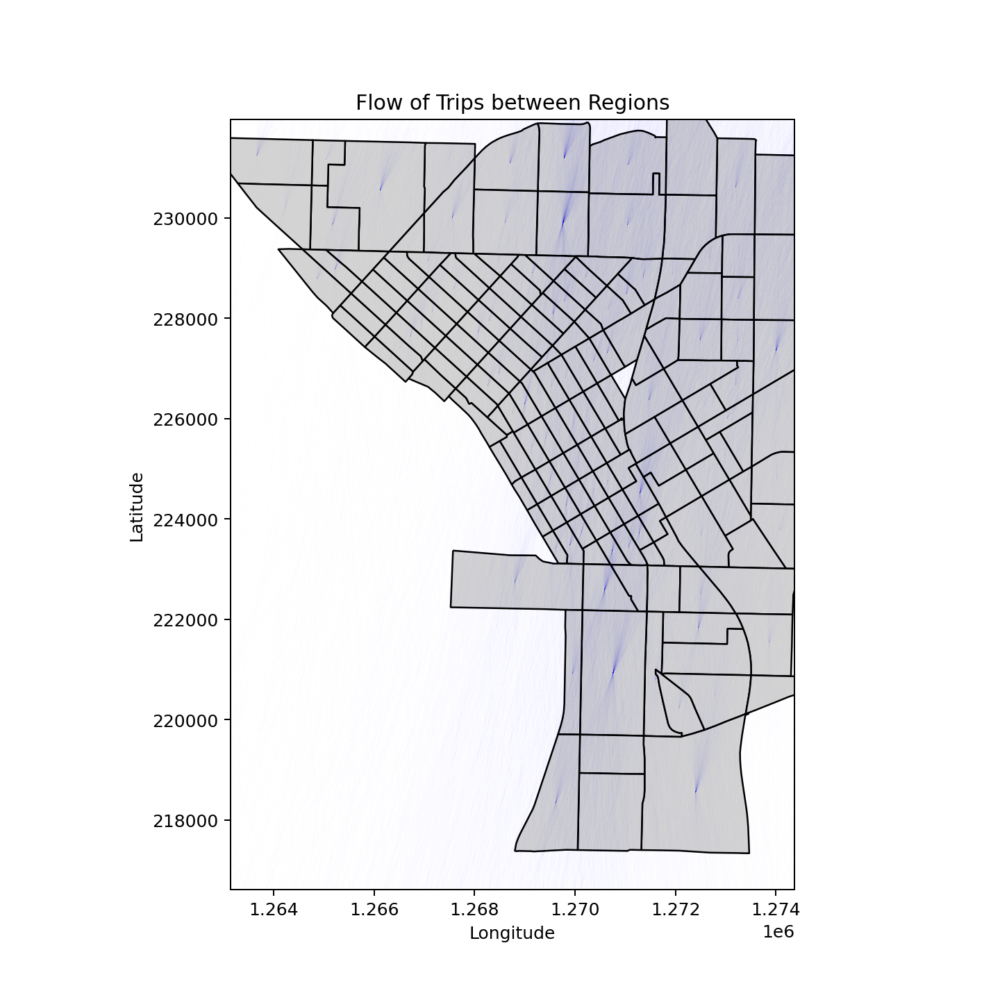

3700
1428


19954it [00:25, 783.93it/s]

total demand: 25656
unidentified_demand:0


In [63]:
show_flow(filtered_data[filtered_data['COUNTY_NM'].isin(['Pierce', 'Snohomish'])], show_used_TAZs=True)

We'll filter King county later and then decide whether to delete these or not.

### trips with O or D in sumo TAZs

In [64]:
sumo_trip_data = filtered_data[filtered_data['O'].isin(sumo_taz) | filtered_data['D'].isin(sumo_taz)]

In [65]:
sumo_trip_data

,TAZ,COUNTY_FIP,COUNTY_NM,geometry,O,D,demand,dest_TAZ
194,431,033,King,"POLYGON ((1271680.263 230753.294, 1271675.995 ...",431,1,1,King
195,432,033,King,"POLYGON ((1270253.153 231905.502, 1270289.392 ...",432,1,8,King
196,433,033,King,"POLYGON ((1270268.400 229639.946, 1270258.932 ...",433,1,4,King
197,434,033,King,"POLYGON ((1269270.472 230956.427, 1269259.920 ...",434,1,1,King
198,435,033,King,"POLYGON ((1269238.332 229679.038, 1269227.752 ...",435,1,1,King
...,...,...,...,...,...,...,...,...
2214275,613,033,King,"POLYGON ((1272087.114 222445.786, 1272080.437 ...",613,3358,1,Pierce
2214276,632,033,King,"POLYGON ((1269872.741 219705.923, 1269662.252 ...",632,3358,1,Pierce
2215316,632,033,King,"POLYGON ((1269872.741 219705.923, 1269662.252 ...",632,2065,1,King
2215483,632,033,King,"POLYGON ((1269872.741 219705.923, 1269662.252 ...",632,2878,1,Pierce


In [66]:
sum(sumo_trip_data.demand)

611872

<IPython.core.display.Javascript object>


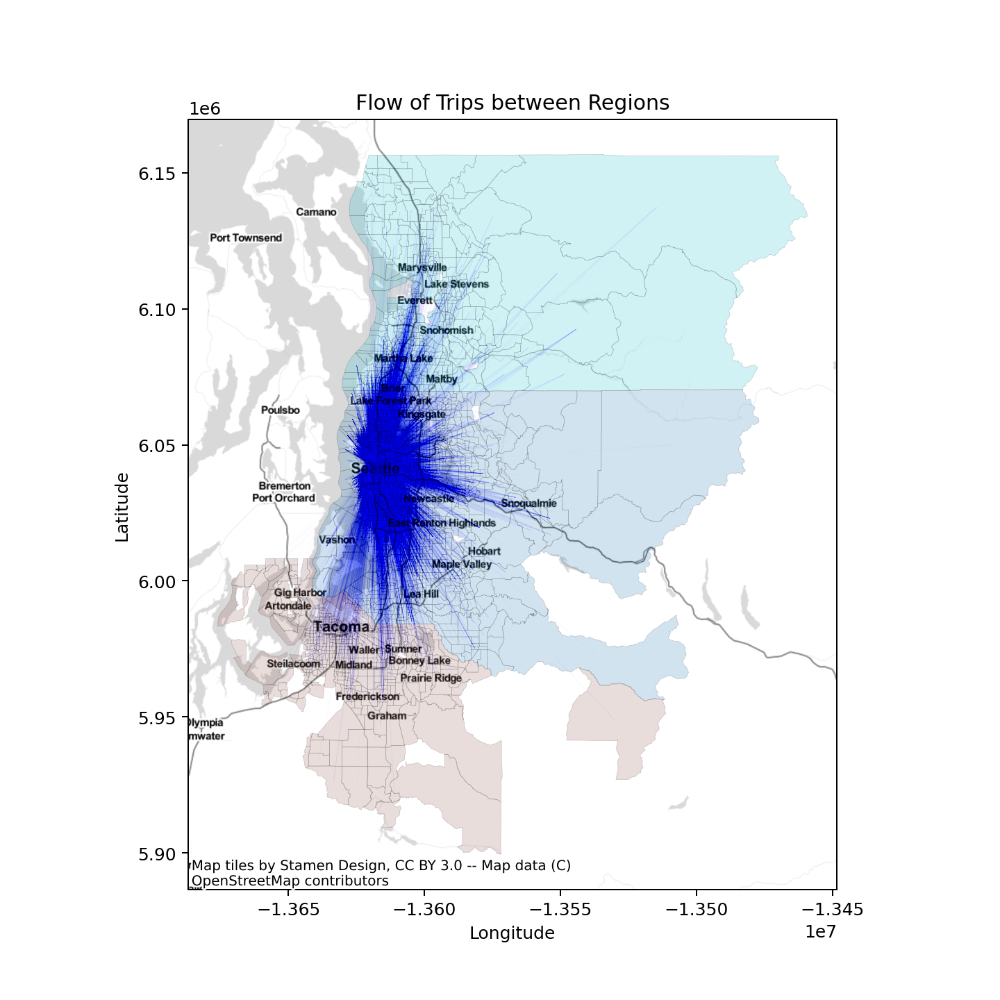

3700
3389


272636it [08:39, 525.11it/s]


total demand: 611872
unidentified_demand:0


In [30]:
show_flow(sumo_trip_data, basemap=True, column='COUNTY_NM', show_used_TAZs=True)

## Filtering King county
we run the code below in qgis python plugin:

<pre>
dir = '/Users/stlp/Library/CloudStorage/GoogleDrive-soheil99@uw.edu/My Drive/reasearch codes/SUMO/MatSumo-main/SUMO/TAZ_convert_code4sumo/regions'
os.chdir(dir)
def get_selected_TAZs(address):
    layer = QgsProject.instance().mapLayersByName("taz2010")[0]
    selected_features = layer.selectedFeatures()
    attribute_list = [feature['TAZ'] for feature in selected_features]
    with open(address, 'w') as f:
        f.write(str(attribute_list))
        f.close()
</pre>
we select some regions in taz2010.shp and then use the command above `get_selected_TAZ('/1.txt')`
and then work like cells below

In [69]:
def read_regions(address):
    with open(address, 'r') as f:
        content = f.read()
        data_list = eval(content)
    return data_list

In [1]:
from IPython.display import Image
Image(url="regions/1.png", width=500, height=500)

In [71]:
reg_1 = read_regions('region images/1.txt')

In [77]:
filtered_data = filtered_data[~((filtered_data['O'].isin(reg_1))
                                &(filtered_data['D'].isin(reg_1)))]

In [78]:
filtered_data.demand.sum()

3583925

## Temporary treatment!
for now we just include trips to/from pierce/king/snohomish/sumo from/to sumo TAZs

In [79]:
final_od = merged_data[(merged_data.COUNTY_NM != 'Kitsap') & (merged_data.dest_TAZ != 'Kitsap')]
# filtered_data = filtered_data[~(
#     (filtered_data.COUNTY_NM.isin(['Pierce', 'Snohomish'])) &
#     (filtered_data.dest_TAZ.isin(['Pierce', 'Snohomish'])) )]

In [80]:
final_od = final_od[final_od['O'].isin(sumo_taz) | final_od['D'].isin(sumo_taz)]

In [81]:
sum(sumo_trip_data.demand)

611872

# TAZ conversion

# making CSV file

In [14]:
input_file = 'psrc_vehicle_trips.csv'
df = pd.read_csv(input_file)
df.head()

,otaz,dtaz,deptm,travtime
0,1,1,341,5
1,1,1,395,5
2,1,1,499,5
3,1,1,509,8
4,1,1,638,7


In [24]:
demand_test =  df[df['otaz'].isin(sumo_taz) & df['dtaz'].isin(sumo_taz)]
demand_test.reset_index(drop=True, inplace=True)

In [25]:
demand_test

,otaz,dtaz,deptm,travtime
0,426,426,329,6
1,426,426,368,4
2,426,426,453,1
3,426,426,454,9
4,426,426,479,4
...,...,...,...,...
96613,653,653,1284,10
96614,653,653,1316,8
96615,653,653,1402,8
96616,653,653,1415,6


In [26]:
len(df)

9985425

In [27]:
len(demand_test)

96618

In [29]:
demand_test.to_csv('psrc_vehicle_trips_converted_taz.csv', index=False)